<a href="https://colab.research.google.com/github/HARSHIT097/COMPUTER_VISION/blob/main/iMAGE_pROCESSING_CV2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
%matplotlib inline

# eXPERMENTS WITH DATA IMPORT 

In [2]:
from google.colab import files
uploaded= files.upload()



Saving medals.csv to medals.csv


In [3]:
file=pd.read_csv(io.BytesIO(uploaded['medals.csv']))
print(file)

NameError: ignored

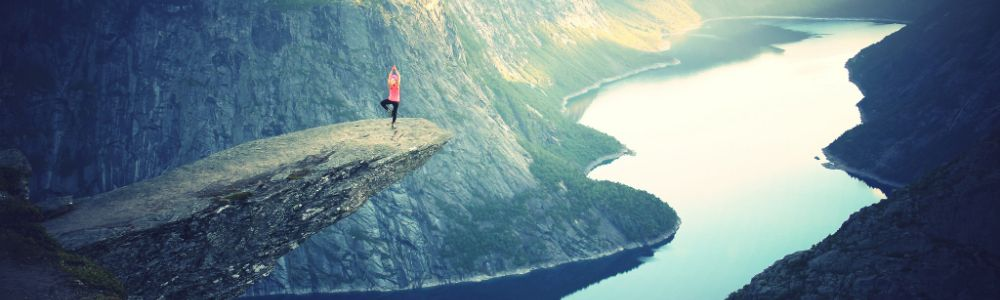

In [4]:
from PIL import Image
import urllib.request

URL = 'http://www.w3schools.com/css/trolltunga.jpg'

with urllib.request.urlopen(URL) as url:
    with open('temp.jpg', 'wb') as f:
        f.write(url.read())

img = Image.open('temp.jpg')

img.show()
#cv2.waitKey()
#plt.show(img)
from IPython.display import Image, display
Image("temp.jpg")


In [ ]:
#from IPython.display import Image, display
#display(Image('1.png'))
#display(Image('2.png'))

# oPEN CV LIBRARY FOR IMAGE PROCESSING

In [5]:
import numpy as np
import pandas as pd
import cv2 as cv 
from google.colab.patches import cv2_imshow # for image display
from skimage import io
from PIL import Image 
import matplotlib.pylab as plt

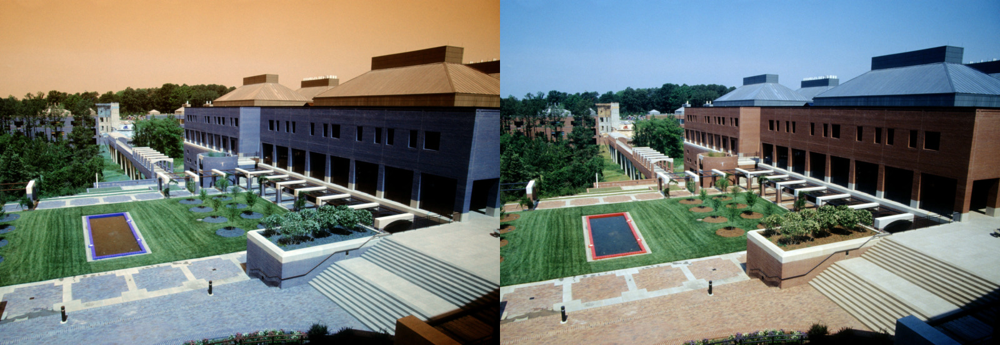

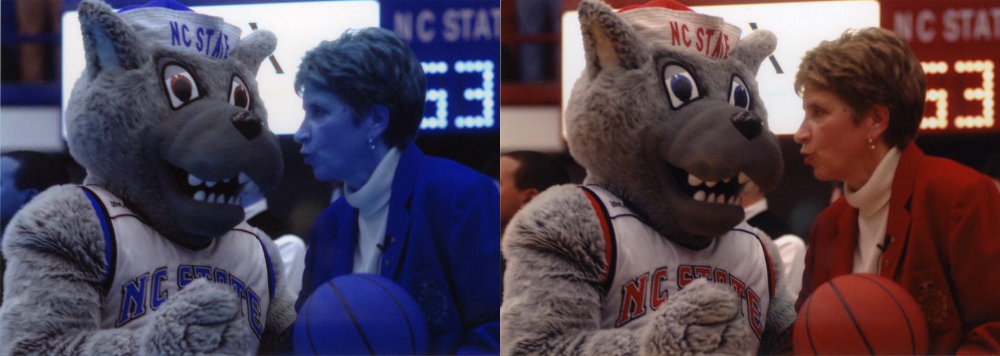

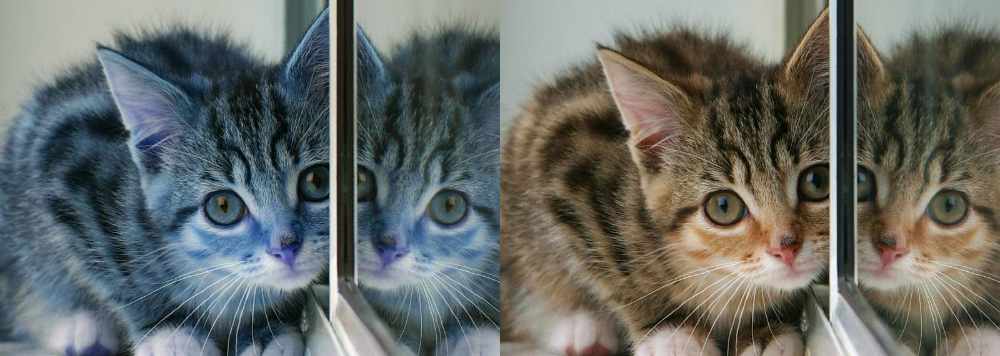

In [6]:
# Create a list to store the urls of the images
urls = ["https://iiif.lib.ncsu.edu/iiif/0052574/full/800,/0/default.jpg",
       "https://iiif.lib.ncsu.edu/iiif/0016007/full/800,/0/default.jpg",
      "https://placekitten.com/800/571"]  
# Read and display the image
# loop over the image URLs, you could store several image urls in the list

for url in urls:
  image = io.imread(url) 
  image_2 = cv.cvtColor(image, cv.COLOR_BGR2RGB)
  final_frame = cv.hconcat((image, image_2))
  cv2_imshow(final_frame)
  print('\n')

In [7]:
## TODO: LOAD IMAGE
## url = 
## myImg = io.imread(url)  
## cv2_imshow(cv.cvtColor(myImg, cv.COLOR_BGR2RGB))
# Check the image matrix data type (could know the bit depth of the image)
print(image.dtype)
# Check the height of image 
print(image.shape[0])
# Check the width of image 
print(image.shape[1])
# Check the number of channels of the image
print(image.shape[2])

uint8
571
800
3


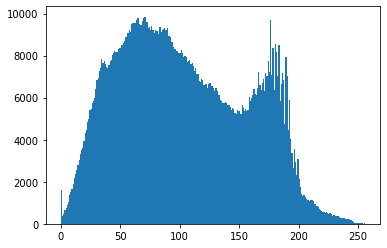

In [8]:
plt.hist(image.ravel(),bins = 256, range = [0,256]) 
plt.show()

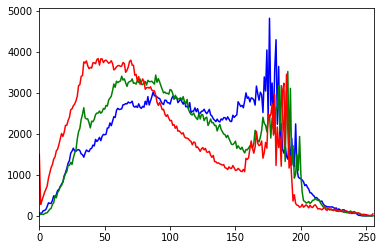

In [9]:
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv.calcHist([image],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
plt.show()

center is the center point of rotation, the angle is the angle in degrees and scale is the scale property which makes the image fit on the screen

3


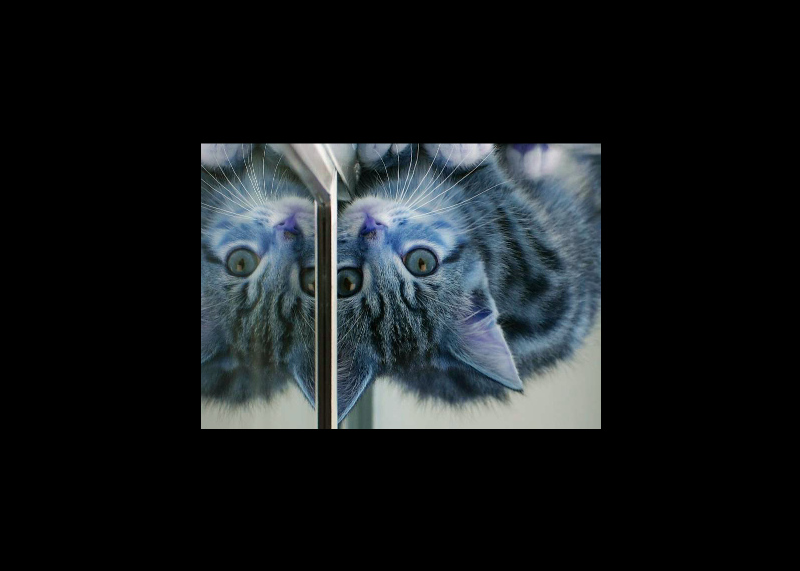

-1

In [17]:

from google.colab.patches import cv2_imshow
# Check the height of image 
height = (image.shape[0])
# Check the width of image 
width = (image.shape[1])
# Check the number of channels of the image
print(image.shape[2])
#cv2.getRotationMatrix2D(center, angle, scale)
rotationMatrix = cv.getRotationMatrix2D((width/2, height/2), 180, .5)
rotatedImage = cv.warpAffine(image, rotationMatrix, (width, height))
cv2_imshow(rotatedImage)

cv.waitKey(0)

Crop an Image

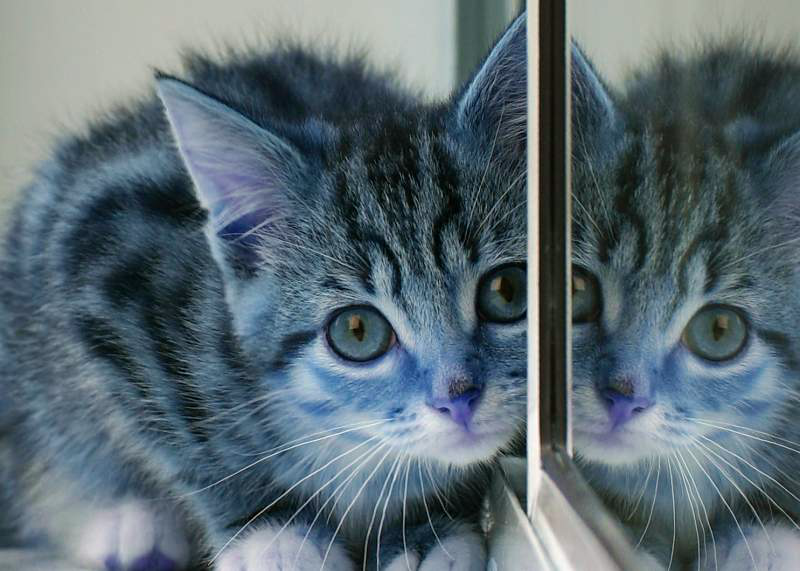

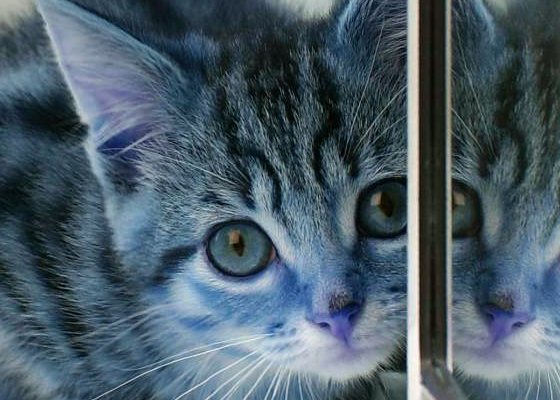

-1

In [20]:
height, width = image.shape[0:2]

startRow = int(height*.15)

startCol = int(width*.15)

endRow = int(height*.85)

endCol = int(width*.85)
croppedImage = image[startRow:endRow, startCol:endCol]
cv2_imshow(image)

cv2_imshow(croppedImage)

cv2.waitKey(0)



Resize an Image

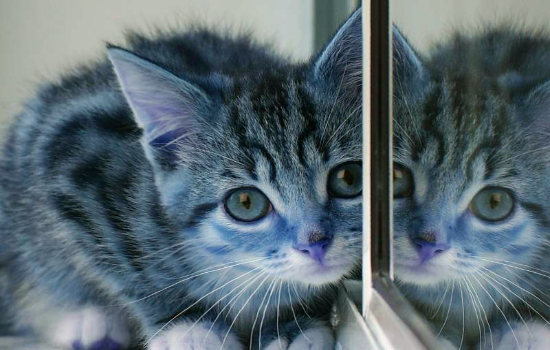

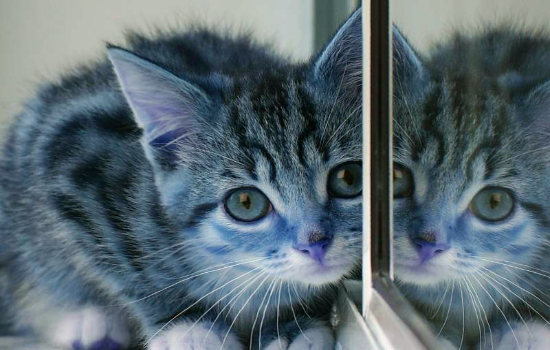

-1

In [28]:
#newImg = cv2.resize(image, (0,0), fx=0.75, fy=0.75)
newImg = cv2.resize(np.float32(image), (550, 350))


cv2_imshow(newImg)

cv2.waitKey(0)

addWeighted() method as it generates the output in the range of 0 and 255 for a 24-bit color image.

a is alpha which defines contrast of the image. If a is greater than 1, there will be higher contrast.

If the value of a is between 0 and 1 (smaller than 1 but greater than 0), there would be lower contrast. If a is 1, there will be no contrast effect on the image.

b stands for beta. The values of b vary from -127 to +127.

In [ ]:
#new_img = a * original_img + b
#cv2.addWeighted(source_img1, alpha1, source_img2, alpha2, beta)

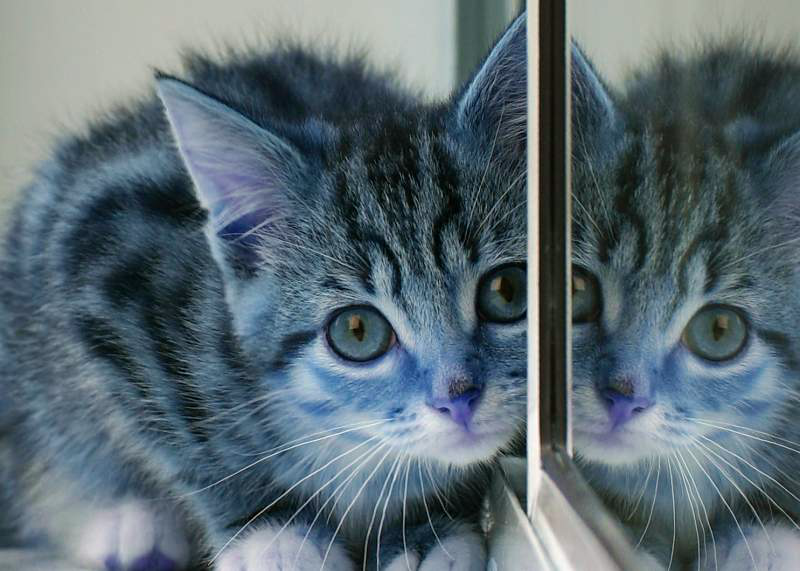

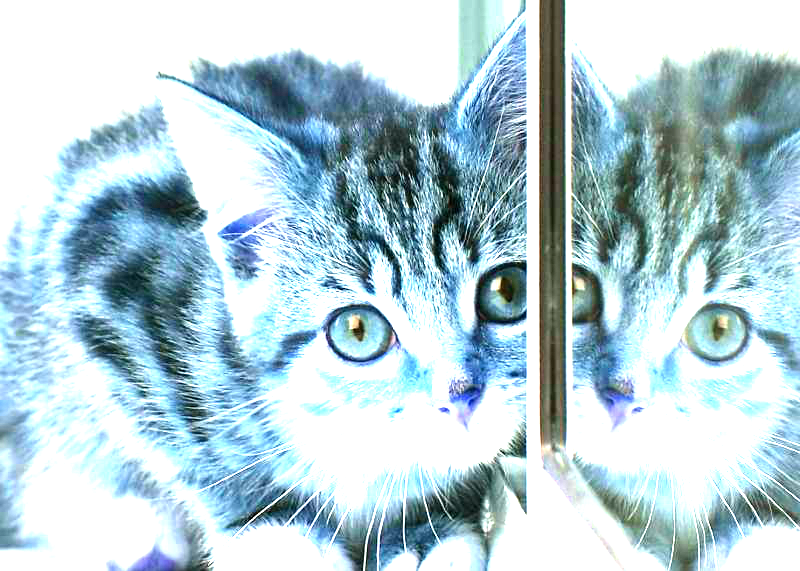

-1

In [29]:
contrast_img = cv2.addWeighted(image, 2.5, np.zeros(image.shape, image.dtype), 0, 0)

cv2_imshow(image)

cv2_imshow(contrast_img)

cv2.waitKey(0)

Make an image blurry
Gaussian Blur
To make an image blurry, you can use the GaussianBlur() method of OpenCV.

The GaussianBlur() uses the Gaussian kernel. The height and width of the kernel should be a positive and an odd number.

Then you have to specify the X and Y direction that is sigmaX and sigmaY respectively. If only one is specified, both are considered the same.

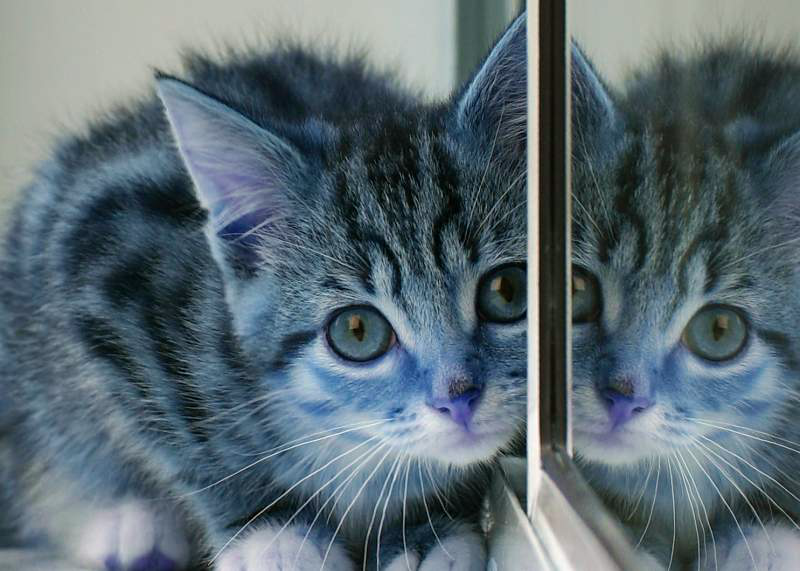

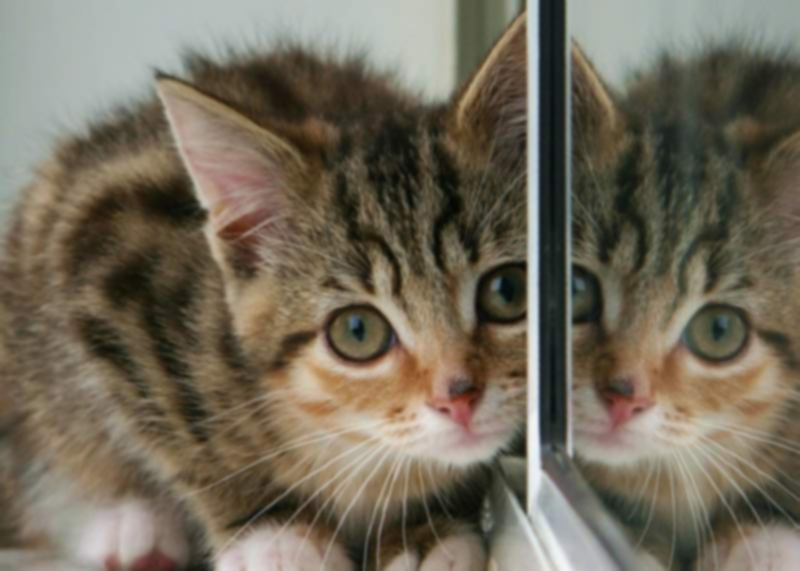

In [31]:
blur_image = cv2.GaussianBlur(image_2, (7,7), 0)

cv2_imshow(image)

cv2_imshow(blur_image)


Median Blur
In median blurring, the median of all the pixels of the image is calculated inside the kernel area. The central value is then replaced with the resultant median value. Median blurring is used when there are salt and pepper noise in the image.

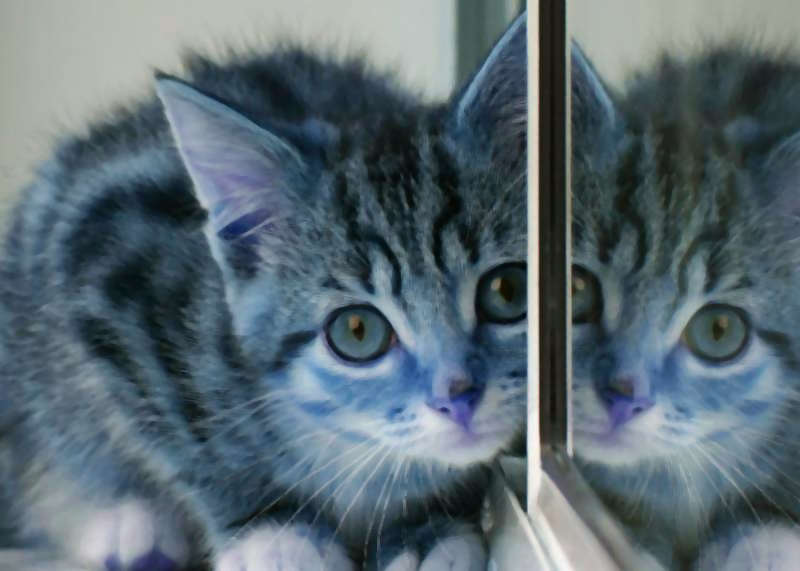

In [33]:
blur_image = cv2.medianBlur(image,5)
cv2_imshow(blur_image)


To detect the edges in an image, you can use the Canny() method of cv2 which implements the Canny edge detector. The Canny edge detector is also known as the optimal detector.

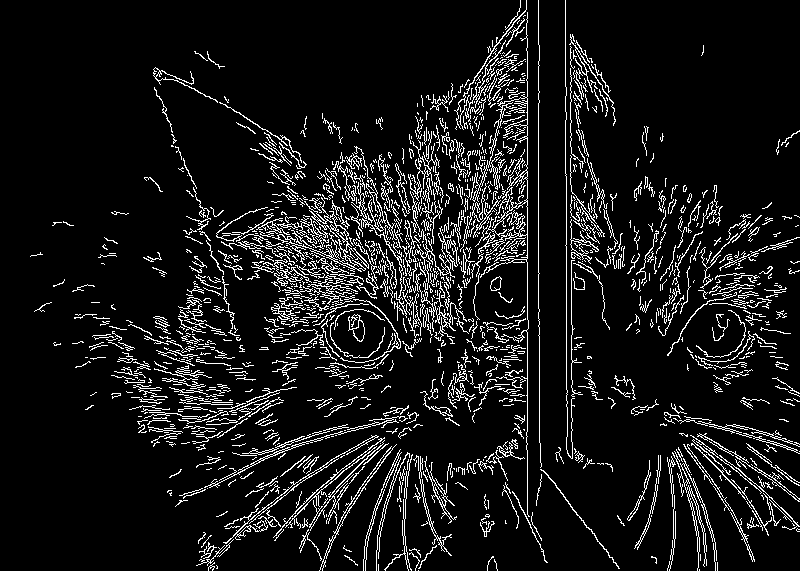

In [35]:
#cv2.Canny(image, minVal, maxVal)
edge_img = cv2.Canny(image,100,200)

cv2_imshow(edge_img)

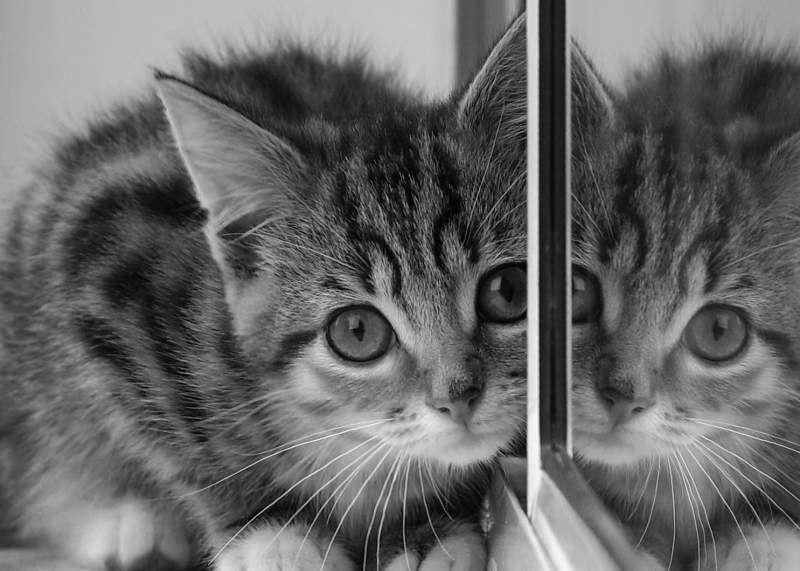

In [10]:
gray_image = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
cv2_imshow(gray_image)

Centroid (Center of blob) detection
To find the center of an image, the first step is to convert the original image into grayscale. We can use the cvtColor() method of cv2 as we did before.

In [36]:
moment = cv2.moments(gray_image)

Then we need to calculate the x and y coordinates of the center of the image by using the moments that we got above:

Finally, we have the center of the image. To highlight this center position, we can use the circle method which will create a circle in the given coordinates of the given radius.

The circle() method takes the img, the x and y coordinates where the circle will be created, the size, the color that we want the circle to be and the thickness.

In [37]:
X = int(moment ["m10"] / moment["m00"])

Y = int(moment ["m01"] / moment["m00"])

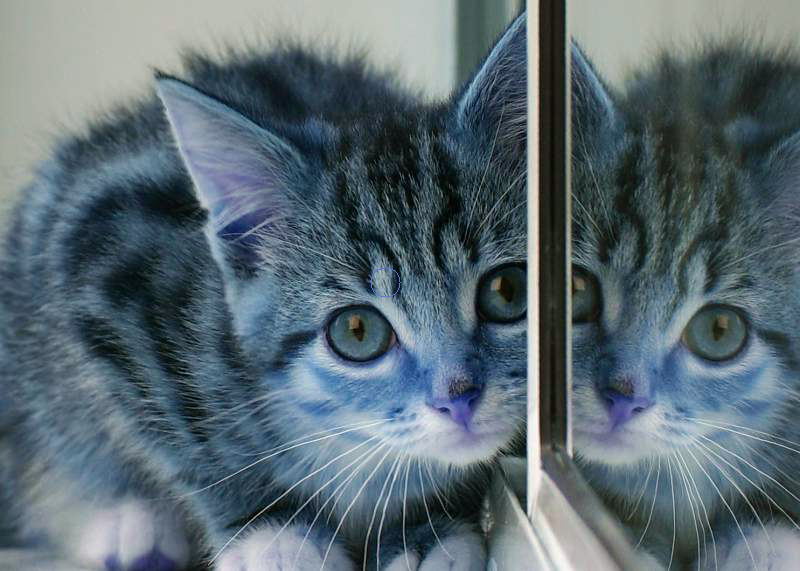

In [38]:
cv2.circle(image, (X, Y), 15, (205, 114, 101), 1)
cv2_imshow(image)

Apply a mask for a colored image
Image masking means to apply some other image as a mask on the original image or to change the pixel values in the image.

To apply a mask on the image, we will use the HoughCircles() method of the OpenCV module. The HoughCircles() method detects the circles in an image. After detecting the circles, we can simply apply a mask on these circles.

The HoughCircles() method takes the original image, the Hough Gradient (which detects the gradient information in the edges of the circle), and the information from the following circle equation:

In [39]:
(x - xcenter)2 + (y - ycenter)2 = r2

SyntaxError: ignored

In [40]:
gray_img = cv2.medianBlur(cv2.cvtColor(image, cv2.COLOR_RGB2GRAY), 3)

circles = cv2.HoughCircles(gray_image, cv2.HOUGH_GRADIENT, 1, 20, param1=50, param2=50, minRadius=0, maxRadius=0)

circles = np.uint16(np.around(circles))

In [41]:
masking=np.full((img1.shape[0], img1.shape[1]),0,dtype=np.uint8)

for j in circles[0, :]:

    cv2.circle(masking, (j[0], j[1]), j[2], (255, 255, 255), -1)

NameError: ignored

In [ ]:
final_img = cv2.bitwise_or(img1, img1, masking=masking)

In [42]:
_, thresh = cv2.threshold(gray_image, 127, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

In [43]:
img_contours = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)[-2]

In [44]:
#Sort the contours:

img_contours = sorted(img_contours, key=cv2.contourArea)

for i in img_contours:

    if cv2.contourArea(i) > 100:

        break

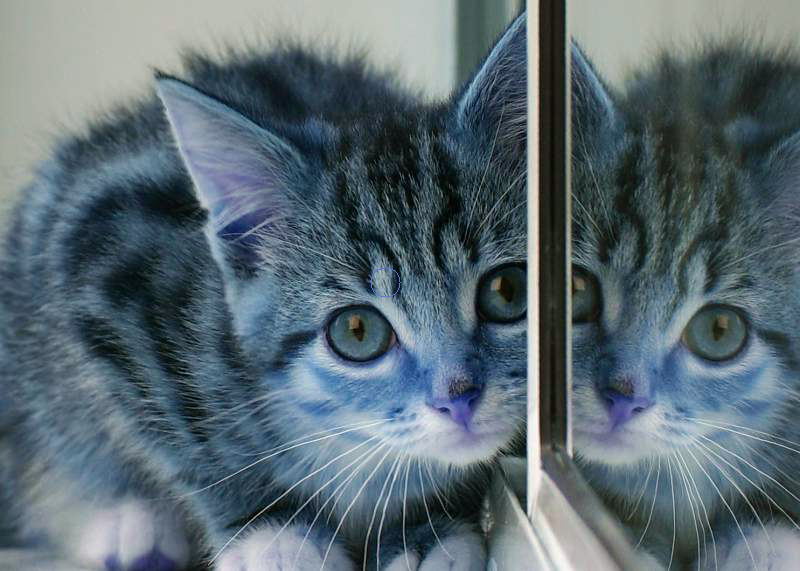

In [45]:
#Generate the mask using np.zeros:
img = image
mask = np.zeros(img.shape[:2], np.uint8)
#Draw contours:

cv2.drawContours(mask, [i],-1, 255, -1)
#Apply the bitwise_and operator:

new_img = cv2.bitwise_and(img, img, mask=mask)
#Display the original image:

#cv2.imshow("Original Image", img)
cv2_imshow(img)

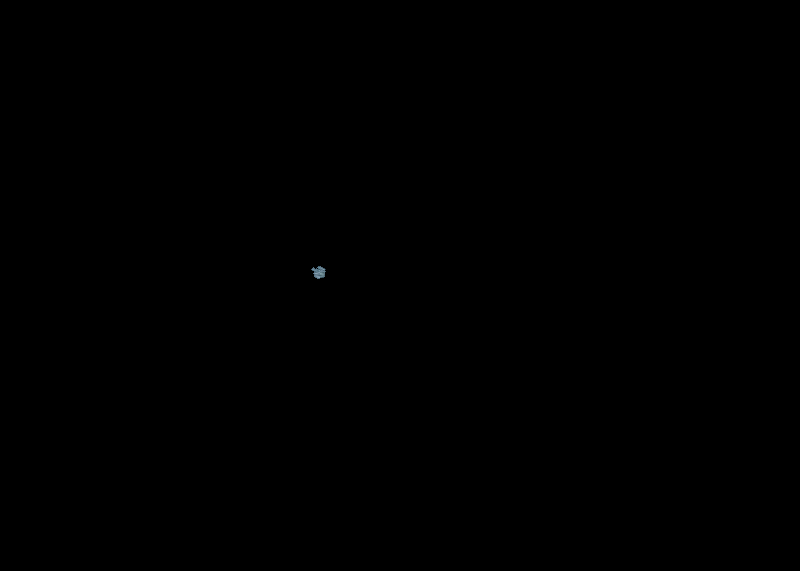

In [46]:
#"Image with background removed", 
cv2_imshow(new_img)

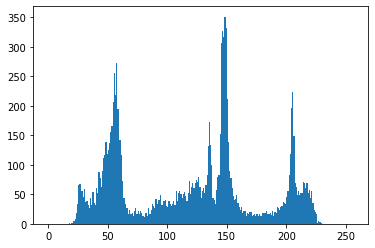

In [ ]:
# Plot the histogram of the gray image. We could observe that the frequency of
# the image hist has decreased ~ 1/3 of the histogram of color image
plt.hist(gray_image.ravel(),bins = 256, range = [0, 256])
plt.show()

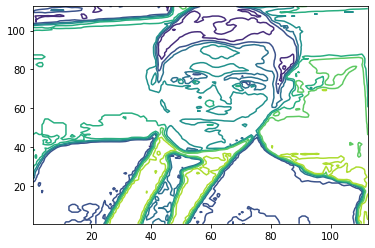

In [ ]:
plt.contour(gray_image, origin = "image")

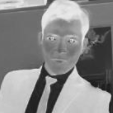

In [ ]:
# This is an inverse operation of the grayscale image, you could see that the
# bright pixels become dark, and the dark pixels become bright
im2 = 255 - gray_image
cv2_imshow(im2)

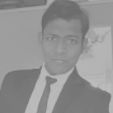

In [ ]:
# Another transform of the image, after adding a constant, 
# all the pixels become brighter and a hazing-like effect of the image is generated
im3 = (100.0/255)*gray_image + 100
cv2_imshow(im3)

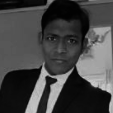

In [ ]:
# The lightness level of the gray_image decreases after this step
im4 = 255.0*(gray_image/255.0)**2
cv2_imshow(im4)

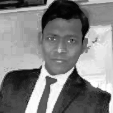

In [ ]:
# function of histogram equalization
def histeq(im, nbr_bins = 256):
  """ Histogram equalization of a grayscale image.  """
  # get the image histogram
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # cumulative distribution function
  cdf = imhist.max()*cdf/cdf.max()  #normalize
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min())*255/(cdf_mask.max()-cdf_mask.min())
  cdf = np.ma.filled(cdf_mask,0).astype('uint8')
  return cdf[im.astype('uint8')]

# apply the function on your dark image to increase the contrast
# we could observe that the contrast of the black background has increased
im5 = histeq(im4)
cv2_imshow(im5)

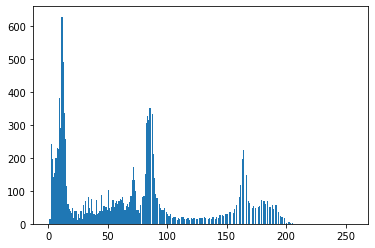

In [ ]:
# Extra: try to visualize the histogram of the image after histogram equalization
# Before histogram equalization
plt.hist(im4.ravel(),bins = 256, range = [0, 256])
plt.show()

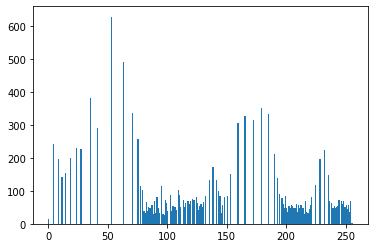

In [ ]:
# After histogram equalization
plt.hist(im5.ravel(),bins = 256, range = [0, 256])
plt.show()

In [ ]:
# Set threshold for the countour detection
ret, thresh = cv.threshold(gray_image,150,255,0)
im2, contours, hierarchy = cv.findContours(thresh, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
cv.drawContours(image, contours, -1, (0, 255, 0), 3)
plt.imshow(image)

ValueError: ignored

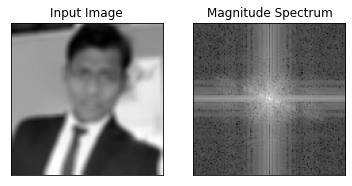

In [ ]:
#Fourier Transform of Gray Images
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur = cv.blur(gray_image,(5,5))
# Transform the image to frequency domain
f = np.fft.fft2(imBlur)
# Bring the zero-frequency component to the center
fshift = np.fft.fftshift(f)
magnitude_spectrum = 30*np.log(np.abs(fshift))

plt.subplot(121),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum, cmap = 'gray')
plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
plt.show()

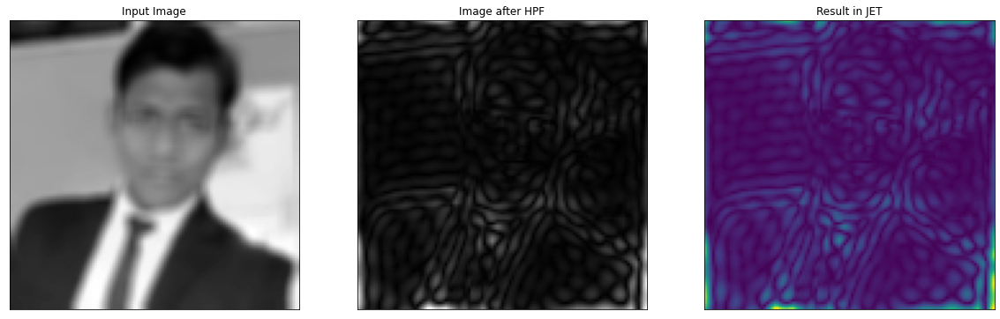

In [ ]:
rows, cols = imBlur.shape
crow,ccol = round(rows/2) , round(cols/2)
# remove low frequencies with a rectangle size of 10
fshift[crow-10:crow+10, ccol-10:ccol+10] = 0
f_ishift = np.fft.ifftshift(fshift)
img_back = np.fft.ifft2(f_ishift)
img_back = np.abs(img_back)

plt.figure(figsize=([20, 20]))
plt.subplot(131),plt.imshow(imBlur, cmap = 'gray')
plt.title('Input Image'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back, cmap = 'gray')
plt.title('Image after HPF'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(img_back)
plt.title('Result in JET'), plt.xticks([]), plt.yticks([])
plt.show()

# Project basic revision